# Exploring moorings timeseries data in Parquet format

In [1]:
import s3fs
s3 = s3fs.S3FileSystem(anon=False)
s3_path = 's3://imos-data-lab-optimised/parquet/timeseries/'
s3.glob(s3_path)

['imos-data-lab-optimised/parquet/timeseries/site_code=PH100']

In [2]:
# let's see what deployment codes are in there
deps = s3.glob(s3_path + 'site_code=PH100/')
deps

['imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-0910',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-0912',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1001',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1002',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1003',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1005',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1006',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1007',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1008',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1009',
 'imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-1010',
 'imos-dat

## Visualise data from a single deployment using Pandas

In [3]:
%%time
import pandas as pd

dep_path = 's3://imos-data-lab-optimised/parquet/timeseries/site_code=PH100/deployment_code=PH100-2112/'
df = pd.read_parquet(dep_path)
df

CPU times: user 2.11 s, sys: 886 ms, total: 2.99 s
Wall time: 8.01 s


,time,timeseries,latitude,longitude,nominal_depth,pres_rel,pres_rel_quality_control,temp,temp_quality_control,cndc,cndc_quality_control,depth,depth_quality_control,psal,psal_quality_control,filename
0,2021-12-14 19:00:01.000001280,1,-34.119717,151.224233,104.0,-0.165,4.0,17.098301,4.0,0.000708,4.0,-0.164,4.0,0.0108,4.0,IMOS_ANMN-NSW_CSTZ_20211215T010000Z_PH100_FV01...
1,2021-12-14 19:05:01.000003584,1,-34.119717,151.224233,104.0,-0.163,4.0,17.124500,4.0,0.000708,4.0,-0.161,4.0,0.0108,4.0,IMOS_ANMN-NSW_CSTZ_20211215T010000Z_PH100_FV01...
2,2021-12-14 19:10:01.000005632,1,-34.119717,151.224233,104.0,-0.164,4.0,17.150700,4.0,0.000708,4.0,-0.163,4.0,0.0108,4.0,IMOS_ANMN-NSW_CSTZ_20211215T010000Z_PH100_FV01...
3,2021-12-14 19:15:00.999997952,1,-34.119717,151.224233,104.0,-0.161,4.0,17.178101,4.0,0.000702,4.0,-0.160,4.0,0.0108,4.0,IMOS_ANMN-NSW_CSTZ_20211215T010000Z_PH100_FV01...
4,2021-12-14 19:20:01.000000256,1,-34.119717,151.224233,104.0,-0.163,4.0,17.201700,4.0,0.000702,4.0,-0.161,4.0,0.0108,4.0,IMOS_ANMN-NSW_CSTZ_20211215T010000Z_PH100_FV01...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436148,2022-03-21 23:45:00.000003328,1,-34.119717,151.224233,88.0,NaN,NaN,23.440886,4.0,NaN,NaN,NaN,4.0,NaN,NaN,IMOS_ANMN-NSW_TZ_20211215T010000Z_PH100_FV01_P...
436149,2022-03-21 23:50:00.000005632,1,-34.119717,151.224233,88.0,NaN,NaN,23.517817,4.0,NaN,NaN,NaN,4.0,NaN,NaN,IMOS_ANMN-NSW_TZ_20211215T010000Z_PH100_FV01_P...
436150,2022-03-21 23:55:00.000007936,1,-34.119717,151.224233,88.0,NaN,NaN,23.605230,4.0,NaN,NaN,NaN,4.0,NaN,NaN,IMOS_ANMN-NSW_TZ_20211215T010000Z_PH100_FV01_P...
436151,2022-03-22 00:00:00.000000000,1,-34.119717,151.224233,88.0,NaN,NaN,23.719522,4.0,NaN,NaN,NaN,4.0,NaN,NaN,IMOS_ANMN-NSW_TZ_20211215T010000Z_PH100_FV01_P...


In [4]:
# let's just pick out the good temperature data with good depth values
import numpy as np

good_rows = np.logical_and(df.temp_quality_control==1,
                           df.depth_quality_control==1)
df_temp = df.loc[good_rows, ['time', 'temp', 'depth', 'nominal_depth']].set_index('time')
df_temp

,temp,depth,nominal_depth
time,,,
2021-12-15 01:10:01.000005632,16.101000,103.017998,104.0
2021-12-15 01:15:00.999997952,16.172100,103.014000,104.0
2021-12-15 01:20:01.000000256,16.196199,102.992996,104.0
2021-12-15 01:25:01.000002304,16.158300,102.933998,104.0
2021-12-15 01:30:01.000004608,16.129999,102.955002,104.0
...,...,...,...
2022-03-17 23:15:00.000000000,16.744102,90.571960,88.0
2022-03-17 23:20:00.000002304,16.738745,90.541321,88.0
2022-03-17 23:25:00.000004352,16.823175,90.581215,88.0


In [11]:
import hvplot
import hvplot.pandas

In [10]:
%%time
df_temp.hvplot.scatter(x='time', y='temp', by='nominal_depth')

CPU times: user 134 ms, sys: 12.1 ms, total: 146 ms
Wall time: 141 ms


:NdOverlay   [nominal_depth]
   :Scatter   [time]   (temp)

In [12]:
# Use Matplotlib to render to a static image for this example
# -- the interactive Bokeh plots seem to slow things down a bit when there are millions of points to plot...
hvplot.extension('matplotlib')

CPU times: user 80.7 ms, sys: 0 ns, total: 80.7 ms
Wall time: 76 ms


:Scatter   [time]   (depth,temp)
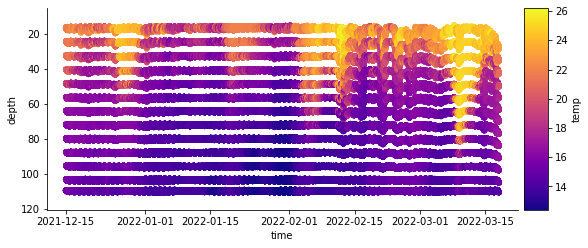

In [13]:
%%time
df_temp.hvplot.scatter(x='time', y='depth', c='temp', cmap='plasma', flip_yaxis=True)

In [14]:
%%time
# Let's try to speed things up by binning timeseries into hourly bins
hourly_temp = df_temp.groupby('nominal_depth', group_keys=False).resample('1H').mean()
hourly_temp

CPU times: user 133 ms, sys: 6 µs, total: 133 ms
Wall time: 135 ms


,temp,depth,nominal_depth
time,,,
2021-12-15 01:00:00,22.070095,16.388962,16.0
2021-12-15 02:00:00,22.050865,16.338102,16.0
2021-12-15 03:00:00,22.120350,16.440098,16.0
2021-12-15 04:00:00,21.973984,16.639635,16.0
2021-12-15 05:00:00,22.009169,16.890905,16.0
...,...,...,...
2022-03-17 19:00:00,14.515322,109.807968,109.5
2022-03-17 20:00:00,14.483626,110.104218,109.5
2022-03-17 21:00:00,14.469474,110.314095,109.5


CPU times: user 30.8 ms, sys: 4.36 ms, total: 35.1 ms
Wall time: 32.4 ms


:Scatter   [time]   (depth,temp)
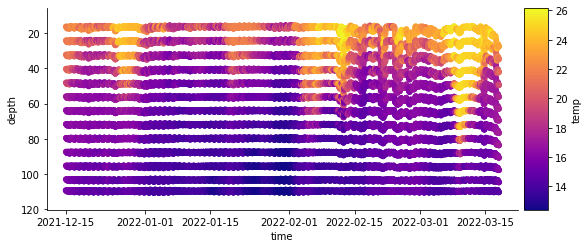

In [15]:
%%time
hourly_temp.hvplot.scatter(x='time', y='depth', c='temp', cmap='plasma', flip_yaxis=True)

## Read and visualise the whole timeseries for a site

In [16]:
%%time
import pandas as pd

full_path = 's3://imos-data-lab-optimised/parquet/timeseries/site_code=PH100/'
df = pd.read_parquet(full_path)
df

CPU times: user 1min 7s, sys: 12.4 s, total: 1min 20s
Wall time: 4min 8s


,time,timeseries,latitude,longitude,nominal_depth,temp,temp_quality_control,pres,pres_quality_control,depth,depth_quality_control,deployment_code,filename
0,2009-10-28 13:00:00.000006656,1,-34.120200,151.224517,104.0,19.221548,4.0,10.20258,4.0,0.06958,4.0,PH100-0910,IMOS_ANMN-NSW_TZ_20091028T130000Z_PH100_FV01_P...
1,2009-10-28 13:04:59.999998976,1,-34.120200,151.224517,104.0,19.217386,4.0,10.20258,4.0,0.06958,4.0,PH100-0910,IMOS_ANMN-NSW_TZ_20091028T130000Z_PH100_FV01_P...
2,2009-10-28 13:10:00.000001024,1,-34.120200,151.224517,104.0,19.213223,4.0,10.20258,4.0,0.06958,4.0,PH100-0910,IMOS_ANMN-NSW_TZ_20091028T130000Z_PH100_FV01_P...
3,2009-10-28 13:15:00.000003328,1,-34.120200,151.224517,104.0,19.209061,4.0,10.20258,4.0,0.06958,4.0,PH100-0910,IMOS_ANMN-NSW_TZ_20091028T130000Z_PH100_FV01_P...
4,2009-10-28 13:20:00.000005632,1,-34.120200,151.224517,104.0,19.210447,4.0,10.20258,4.0,0.06958,4.0,PH100-0910,IMOS_ANMN-NSW_TZ_20091028T130000Z_PH100_FV01_P...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22844873,2022-09-24 02:00:00.000003328,1,-34.120083,151.224267,88.0,18.785414,4.0,NaN,NaN,NaN,4.0,PH100-2206,IMOS_ANMN-NSW_TZ_20220616T013500Z_PH100_FV01_P...
22844874,2022-09-24 02:05:00.000005632,1,-34.120083,151.224267,88.0,18.794985,4.0,NaN,NaN,NaN,4.0,PH100-2206,IMOS_ANMN-NSW_TZ_20220616T013500Z_PH100_FV01_P...
22844875,2022-09-24 02:10:00.000007936,1,-34.120083,151.224267,88.0,18.804556,4.0,NaN,NaN,NaN,4.0,PH100-2206,IMOS_ANMN-NSW_TZ_20220616T013500Z_PH100_FV01_P...
22844876,2022-09-24 02:15:00.000000000,1,-34.120083,151.224267,88.0,18.812761,4.0,NaN,NaN,NaN,4.0,PH100-2206,IMOS_ANMN-NSW_TZ_20220616T013500Z_PH100_FV01_P...


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22844878 entries, 0 to 22844877
Data columns (total 13 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   time                   datetime64[ns]
 1   timeseries             Int32         
 2   latitude               float64       
 3   longitude              float64       
 4   nominal_depth          float32       
 5   temp                   float32       
 6   temp_quality_control   float32       
 7   pres                   float32       
 8   pres_quality_control   float32       
 9   depth                  float32       
 10  depth_quality_control  float32       
 11  deployment_code        category      
 12  filename               category      
dtypes: Int32(1), category(2), datetime64[ns](1), float32(7), float64(2)
memory usage: 1.3 GB


In [18]:
%%time
# Let's skip the columns we don't need right now...
df = pd.read_parquet(full_path,
                     columns=['time', 'nominal_depth', 'temp', 'temp_quality_control', 'depth', 'depth_quality_control']
                    )
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22844878 entries, 0 to 22844877
Data columns (total 6 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   time                   datetime64[ns]
 1   nominal_depth          float32       
 2   temp                   float32       
 3   temp_quality_control   float32       
 4   depth                  float32       
 5   depth_quality_control  float32       
dtypes: datetime64[ns](1), float32(5)
memory usage: 610.0 MB
CPU times: user 1min 5s, sys: 10.3 s, total: 1min 16s
Wall time: 4min 1s


In [19]:
%%time
good_rows = np.logical_and(df.temp_quality_control==1,
                           df.depth_quality_control==1)
df_temp = df.loc[good_rows, ['time', 'temp', 'depth', 'nominal_depth']].set_index('time')
hourly_temp = df_temp.groupby('nominal_depth', group_keys=False).resample('1H').mean()
hourly_temp

CPU times: user 3.54 s, sys: 3.83 s, total: 7.37 s
Wall time: 7.4 s


,temp,depth,nominal_depth
time,,,
2015-03-11 00:00:00,22.978018,16.669546,15.0
2015-03-11 01:00:00,23.069805,16.956310,15.0
2015-03-11 02:00:00,22.717556,17.652716,15.0
2015-03-11 03:00:00,22.864830,18.049784,15.0
2015-03-11 04:00:00,23.087500,18.449617,15.0
...,...,...,...
2022-09-20 00:00:00,17.071217,109.101921,109.5
2022-09-20 01:00:00,17.144297,109.184853,109.5
2022-09-20 02:00:00,17.191181,109.323883,109.5


CPU times: user 151 ms, sys: 1.48 ms, total: 153 ms
Wall time: 150 ms


:Scatter   [time]   (depth,temp)
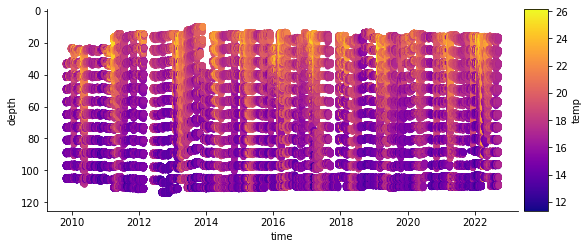

In [20]:
%%time
hourly_temp.hvplot.scatter(x='time', y='depth', c='temp', cmap='plasma', flip_yaxis=True, width=700, height=300)

Not sure why `%%time` doesn't measure this properly, but the actual time taken for the plot to appear is about 18s (matplotlib backend) to 30sec (Bokeh). Maybe to do with it being rendered by a separate process (javascript for Bokeh).